# Fine Clustering

Inspired by the Transient analysis, the idea here is to first cluster cells into a large number of small clusters with ~1000 cells each, and then cluster peaks that light up in sets of cell clusters. This would enable a better analysis of transient peaks.

**TODO**: In the future, precompute clusters at different resolutions and store in metadata.tsv

In [1]:
library(SnapATAC)
library(reshape2)
library(viridis)
library(scales)
library(ggplot2)
library(ggrepel)
library(DESeq2)
library(ClusterR)
library(RColorBrewer)
library(patchwork)
library(cowplot)

Loading required package: Matrix

Loading required package: rhdf5

Loading required package: viridisLite


Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal


Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:SnapATAC’:

    colMeans, colSums, rowMeans, rowSums


The following objects are masked from ‘package:Matrix’:

    colMeans, colSums, rowMeans, rowSums, which


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated,

In [2]:
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [3]:
DAYS = c()
FILE_PREFIX = "/srv/scratch/surag/scATAC-reprog/snap"

file.list = c()
barcode.file.list = c()

for (i in seq(0, 14, 2)) {
    DAYS = c(DAYS, sprintf("D%d", i))
    file.list = c(file.list, sprintf("%s/D%d.snap", FILE_PREFIX, i))
}
DAYS
file.list

[1] "D0"  "D2"  "D4"  "D6"  "D8"  "D10" "D12" "D14"

[1] "/srv/scratch/surag/scATAC-reprog/snap/D0.snap" 
[2] "/srv/scratch/surag/scATAC-reprog/snap/D2.snap" 
[3] "/srv/scratch/surag/scATAC-reprog/snap/D4.snap" 
[4] "/srv/scratch/surag/scATAC-reprog/snap/D6.snap" 
[5] "/srv/scratch/surag/scATAC-reprog/snap/D8.snap" 
[6] "/srv/scratch/surag/scATAC-reprog/snap/D10.snap"
[7] "/srv/scratch/surag/scATAC-reprog/snap/D12.snap"
[8] "/srv/scratch/surag/scATAC-reprog/snap/D14.snap"

In [4]:
x.sp.ls = lapply(seq(file.list), function(i) {
    x.sp = createSnap(file = file.list[i],                      
                     sample = DAYS[i])
    x.sp
})

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...



In [5]:
# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20200220_n74838/metadata.tsv", header = T)
metaData$barcode = lapply(strsplit(rownames(metaData), '_'), "[[", 2)
metaData = metaData[order(rownames(metaData)), ]
head(metaData, 2)

,sample,umap.1,umap.2,cluster,barcode
,<fct>,<dbl>,<dbl>,<int>,<list>
D0_AAACAACGACGATTAC,D0,6.545686,-7.701751,2,AAACAACGACGATTAC
D0_AAACAACGACTCACGG,D0,5.180663,-7.633298,2,AAACAACGACTCACGG


In [6]:
# Filter cells 
x.sp.list = lapply(seq(x.sp.ls), function(i){
  x.sp = x.sp.ls[[i]];
  x.sp  = x.sp[x.sp@barcode %in% metaData[as.character(metaData$sample)==DAYS[i], "barcode"],];
})
names(x.sp.list) = DAYS;

In [7]:
x.sp.list = lapply(seq(x.sp.list), function(i) {
    x.sp = addPmatToSnap(x.sp.list[[i]], num.cores=5)
    x.sp
})

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...

Epoch: reading cell-peak count matrix session ...



In [8]:
# merge timepoints
x.sp = Reduce(snapRbind, x.sp.list);

Warning message:
“'rBind' is deprecated.
 Since R version 3.2.0, base's rbind() should work fine with S4 objects”


In [9]:
# order by sample_barcode
x.sp = x.sp[order(paste(x.sp@sample, x.sp@barcode, sep='_')), ]

In [10]:
# Note that the peaks matrix is not binarized

In [11]:
x.sp@cluster = factor(metaData$cluster)
slot(x.sp, "umap") = as.matrix(metaData[, c("umap.1", "umap.2")])

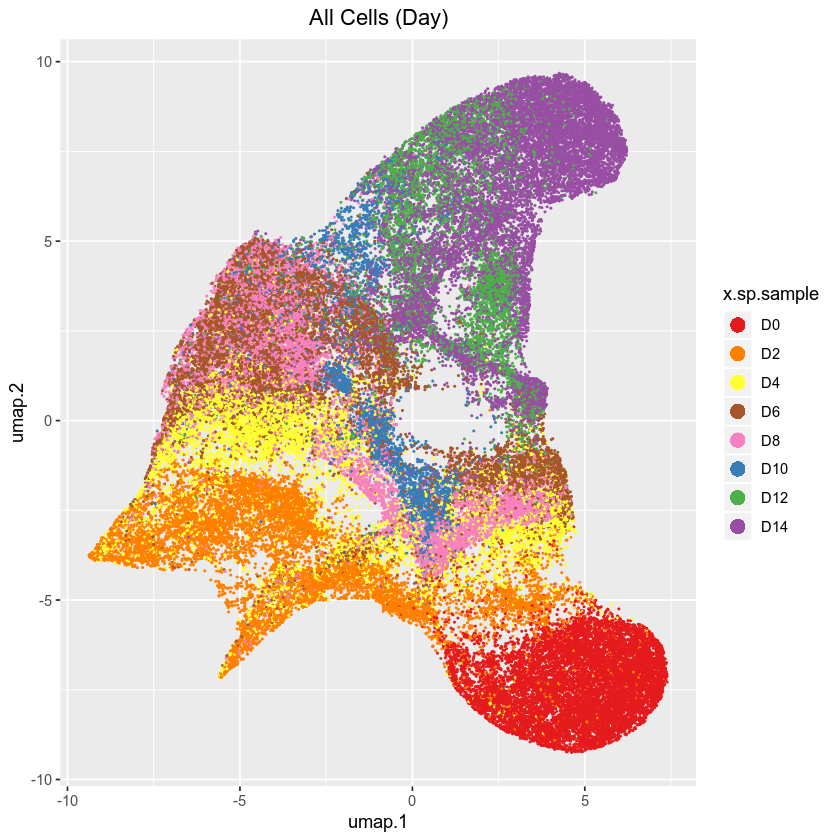

In [12]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, x.sp@sample)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=x.sp.sample)) +
scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5)) + 
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Finer Clustering

In [13]:
library(RANN)
library(leiden)

In [14]:
feats = read.table("../20200206_pmat_snapATAC/sessions/20200220_n74838/features.tsv", header = T)
feats = feats[order(rownames(feats)),]
feats = feats[, 5:ncol(feats)]
head(feats,3)

,X1,X2,X3,X4,X5,X6,X7,X8,X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D0_AAACAACGACGATTAC,-0.009506306,0.003827220,0.004101834,-0.009462710,0.0016989356,-0.006388548,0.004262987,0.003578299,-0.0055907033
D0_AAACAACGACTCACGG,-0.009003734,0.002892498,0.004525334,-0.004391663,0.0009756110,-0.010070413,0.005721408,0.003989271,0.0005145822
D0_AAACAACGAGCGCACT,-0.009416234,0.003781612,0.004398451,-0.006866973,0.0005773408,-0.007889277,0.005984896,0.004210641,-0.0032638603


In [15]:
K = 15

nn.ranked <- nn2(
        data = feats,
        k = K,
        searchtype = 'standard',
        eps = 0)$nn.idx;

j <- as.numeric(x = t(x = nn.ranked))
i <- ((1:length(x = j)) - 1) %/% K + 1
edgeList = data.frame(i, j, 1);
kmat = Matrix(0, nrow(feats), nrow(feats), sparse=TRUE);
kmat = sparseMatrix(i = edgeList[,1], j = edgeList[,2], x = edgeList[,3]);
nn_graph = SnapATAC:::newKgraph(mat=kmat, k=K, snn=FALSE, snn.prune=1/15);

In [16]:
clusters = leiden(SnapATAC:::getGraph(nn_graph), resolution=2)

In [17]:
table(clusters)

clusters
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
4431 3340 3070 2874 2852 2818 2818 2542 2514 2436 2347 2329 2324 2317 2223 2136 
  17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32 
2087 2085 1979 1965 1937 1927 1783 1688 1673 1667 1632 1527 1502 1483 1260 1203 
  33   34   35   36 
1168 1043  939  919 

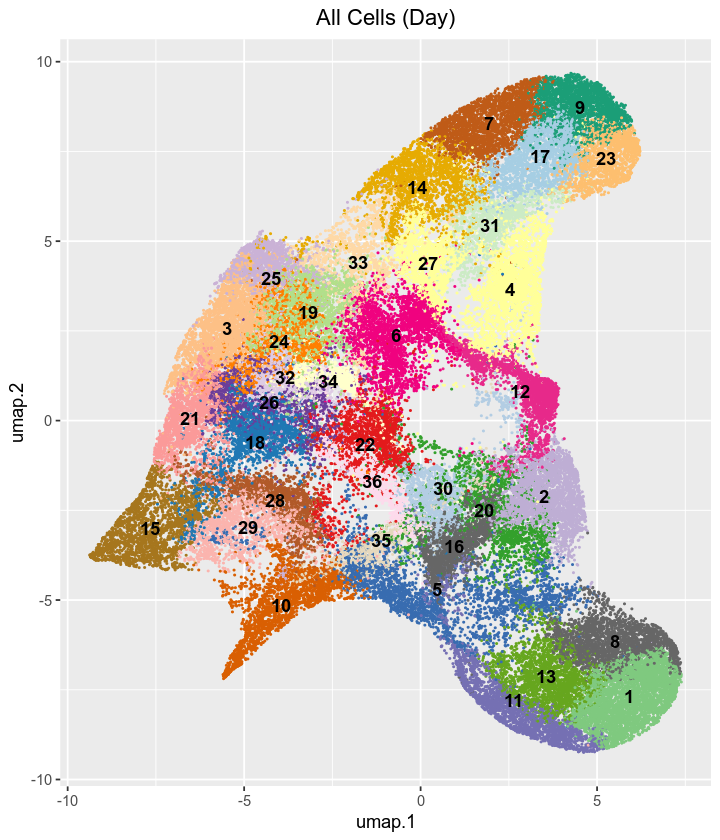

In [27]:
options(repr.plot.width = 6, repr.plot.height = 7)

df = data.frame(x.sp@umap, clst=as.factor(clusters))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector) +
geom_text(data=data.frame(aggregate(x.sp@umap, list(clusters), mean)),
         aes(x=umap.1, y=umap.2, label=Group.1), fontface = "bold") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5),
      legend.positio = "none")
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Make pseudo-bulk matrix

In [19]:
agg_matrix = sparseMatrix(i=clusters,
                         j=seq(1,nrow(x.sp)),
                         x=1L,
                         dims=c(length(table(clusters)), nrow(x.sp)))

In [20]:
cts = as.matrix(agg_matrix %*% x.sp@pmat)
colnames(cts) = as.character(x.sp@peak)
rownames(cts) = paste("cluster", seq(1,nrow(cts)), sep="_")
cts = t(cts)
head(cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_27,cluster_28,cluster_29,cluster_30,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36
chr1:16147-16347,19,8,14,7,1,6,10,1,2,2,⋯,0,2,4,2,0,6,4,9,3,2
chr1:51459-51659,0,1,0,1,0,0,2,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
chr1:51689-52109,1,0,2,5,0,0,11,0,4,0,⋯,0,0,1,0,1,1,3,3,0,0
chr1:180686-181260,82,22,42,33,8,21,21,19,14,6,⋯,6,7,6,15,7,30,28,26,6,4
chr1:181268-181597,62,14,41,57,10,31,22,9,23,32,⋯,12,4,14,19,8,31,39,38,11,7
chr1:184385-184585,26,6,11,16,15,7,7,6,2,14,⋯,3,1,9,9,1,9,6,23,2,4


In [21]:
cts = cts[rowSums(cts)>50, ]
dim(cts)

[1] 457477     36

In [22]:
norm_cts = t(t(cts)/estimateSizeFactorsForMatrix(cts))

In [23]:
log_norm_cts = log2(1+norm_cts)

In [28]:
# cts_to_cluster = log_norm_cts 
cts_to_cluster = log2(1+200*(norm_cts/width(GRanges(rownames(norm_cts)))))
# cts_to_cluster = t(scale(t(log_norm_cts)))

In [48]:
# ADD RAND SEED - not required

km_mb = MiniBatchKmeans(cts_to_cluster, 
                        batch_size = 1000,
                        clusters=20,
                        num_init = 10, 
                        verbose = FALSE)

In [49]:
# reorder based on hierarchical clustering
# pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

# distance    = dist(t(scale(t(km_mb$centroids))))
# cluster     = hclust(distance, method="ward")
# dendrogram  = as.dendrogram(cluster)
# rowInd = rev(order.dendrogram(dendrogram))
# pr_mb = order(rowInd)[pr_mb]

In [50]:
# no hierarchical clustering, follow order of km_mb$centroids
pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

In [51]:
table(pr_mb)

pr_mb
    1     2     3     4     5     6     7     8     9    10    11    12    13 
21314 12378 19126 23985 23803 22042 24286 10926 28638 15245 22607 18420 35581 
   14    15    16    17    18    19    20 
28186 22258 34012 20077 25440 15281 33872 

In [52]:
order(rowVars(km_mb$centroids))

[1]  4  3  8 20 16  7 11  9 15  5 14  6 13 18 19 10  1  2 12 17

In [53]:
cts_clustered = cts_to_cluster[order(pr_mb),]
head(cts_clustered, 2)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_27,cluster_28,cluster_29,cluster_30,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35,cluster_36
chr1:51689-52109,0.1819474,0.000000,0.5280834,1.161110,0,0.0000000,3.173000,0.000000,2.890442,0.00000,⋯,0.000000,0.000000,0.5987078,0.0000000,1.205999,0.3788392,1.032444,0.7372544,0.00000,0.000000
chr1:2083154-2083354,1.5708216,1.969446,0.9454629,2.362645,0,0.9002365,3.345069,2.234184,3.469528,3.91267,⋯,3.171224,1.629296,1.6574939,0.9010832,2.694872,1.5295358,2.611062,1.5173935,2.21833,1.352952


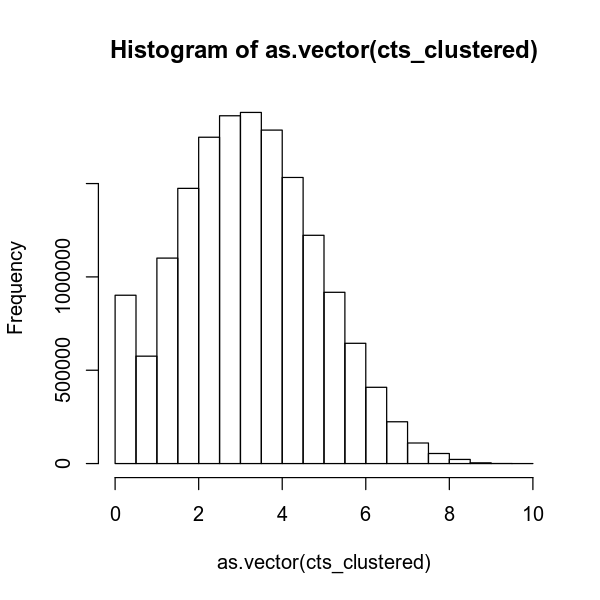

In [54]:
options(repr.plot.width = 5, repr.plot.height = 5)
hist(as.vector(cts_clustered))

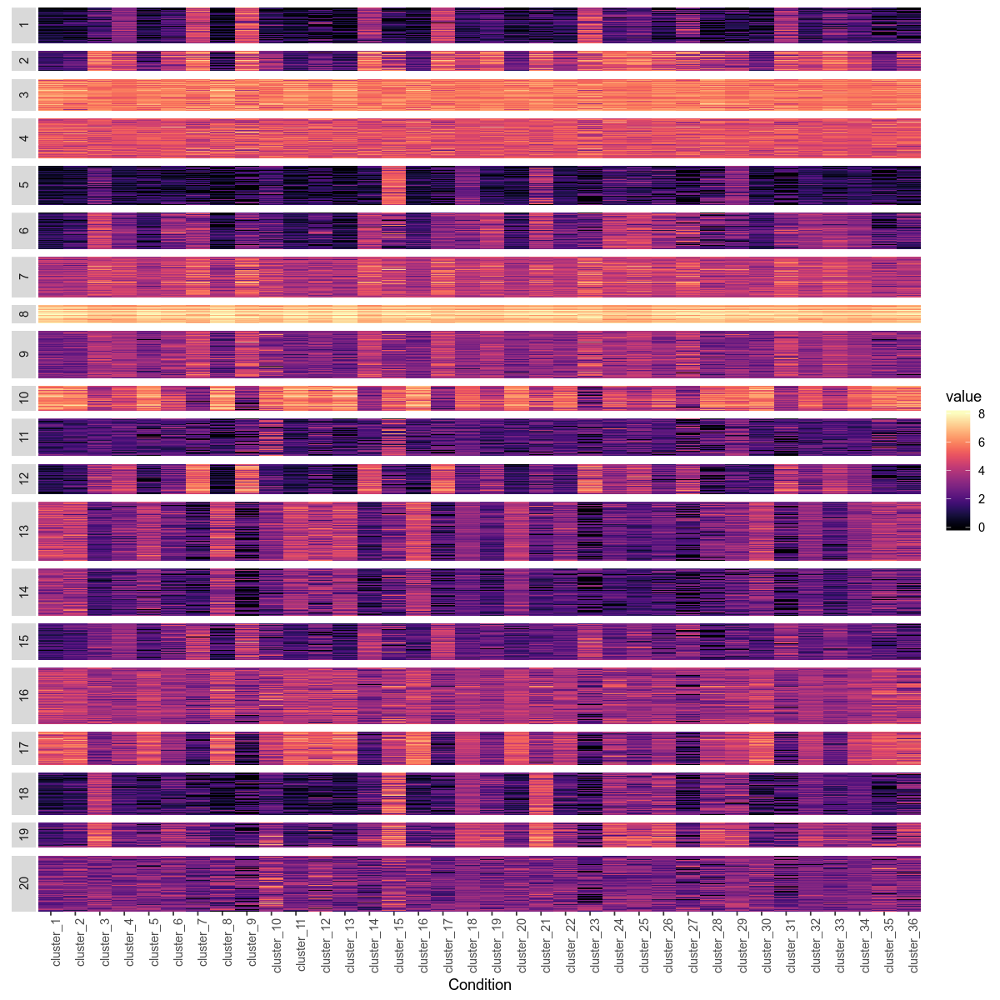

In [55]:
options(repr.plot.width = 10, repr.plot.height = 10)

idxs = seq(1, nrow(cts_clustered), 10) # if subsample
ggplot(data = melt(cts_clustered[idxs, ]), 
       mapping = aes(x = Var2,
                     y = Var1,
                     fill = value)) +
geom_tile()  + ylab(NULL) + xlab("Condition") +  
geom_raster(aes(fill=value)) +
scale_fill_viridis(limits=c(0, 8), oob=squish, option = "A") +
# scale_fill_viridis(option="A") + 
# scale_fill_gradient2(low="red", mid="black", high="blue") +
facet_grid(sort(pr_mb)[idxs] ~ ., switch = "y", scales = "free_y", space = "free_y")+
# theme_classic() +
theme(axis.text.x=element_text(angle=90,hjust=1),
      axis.text.y=element_blank(),
      axis.ticks.y=element_blank())
#       panel.spacing.y = unit(0.03, "cm"),
#       strip.text.y = element_text(size = 3))  
#       strip.background = element_rect(size = 0.1))

# ggsave(sprintf("figs/%s_heatmap_idr_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        dpi=1000)

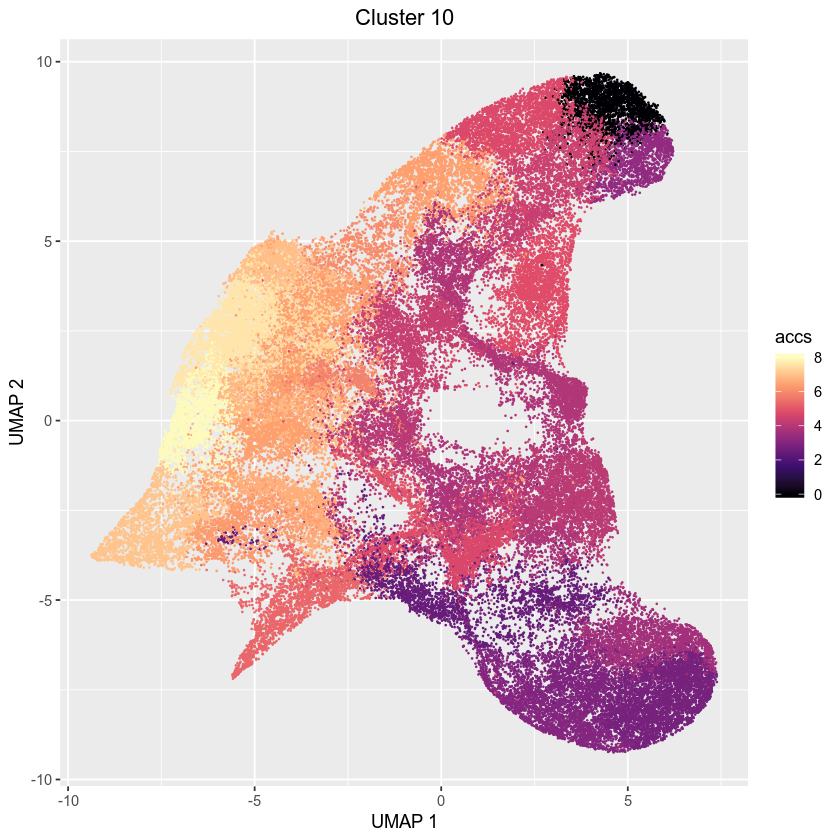

In [56]:
options(repr.plot.width = 7, repr.plot.height = 7)
selected_cluster_id = 10

# visualize a centroid
# df = data.frame(x.sp@umap, accs=km_mb$centroids[selected_cluster_id, ][clusters])

# or a specific peak
df = data.frame(x.sp@umap, accs=log_norm_cts["chr22:35431834-35432287", ][clusters])

# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.1, alpha=1, aes(x=umap.1 , y=umap.2, col=accs)) +
ggtitle(sprintf("Cluster %d", selected_cluster_id)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(0, 8), oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5))

In [60]:
plots = list()
for (i in seq(1,20)) {
    df = data.frame(x.sp@umap, centroid_accs=km_mb$centroids[i, ][clusters])
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 20000), ]
    
    plots[[i]] <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=centroid_accs)) +
    ggtitle(sprintf("Cluster %d", i)) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(0,7), oob=squish, option = "A") +
    theme(plot.title = element_text(hjust = 0.5),
         legend.position = "none",
         axis.ticks = element_blank(),
         axis.text =element_blank())
}

In [61]:
# get legend
df = data.frame(x.sp@umap, centroid_accs=km_mb$centroids[1, ][clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1], 20000), ]

cur_plot <- ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=centroid_accs)) +
ggtitle(sprintf("Cluster %d", i)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(0, 7), oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

legend_only = cowplot::get_legend(cur_plot)

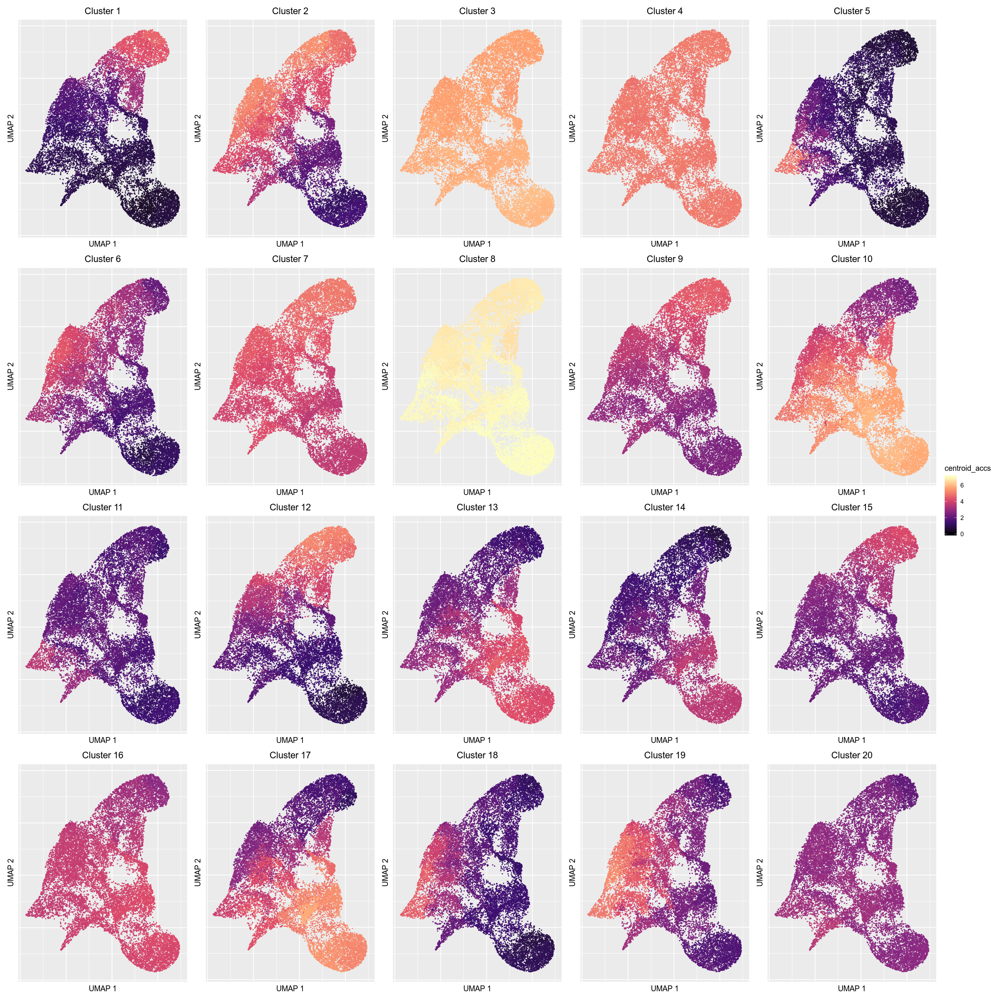

In [64]:
options(repr.plot.width = 20, repr.plot.height = 20)
wrap_plots(wrap_plots(plots, ncol = 5), legend_only, widths=c(0.95,0.05)) +
ggsave(sprintf("figs/%s_gridmap_peakwidthnorm_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
       width=20, height=20, dpi=1000)

## Writing BED files for some clusters

In [65]:
CLUSTER_IDX = 1
NORM = 'gridmap_peakwidthnorm'
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), CLUSTER_IDX)
# rownames(vsd_assay_to_cluster_normalized)[(which(pr_mb==CLUSTER_IDX))]
BED_PATH

[1] "beds/20200330_gridmap_peakwidthnorm_n20/idx1.bed"

In [66]:
for (i in seq(1,length(table(pr_mb)))){
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), i)
fileConn = file(BED_PATH)
writeLines(sub('-', '\t', sub(':', '\t', rownames(cts_to_cluster)))[(which(pr_mb==i))], fileConn)
close(fileConn)}

In [67]:
ALL_PEAKS_BED_PATH = sprintf("beds/%s_%s_n%d/all_peaks.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)))
print(ALL_PEAKS_BED_PATH)
fileConn = file(ALL_PEAKS_BED_PATH)
writeLines(sub('-', '\t', sub(':', '\t', rownames(cts_to_cluster))), fileConn)
close(fileConn)

[1] "beds/20200330_gridmap_peakwidthnorm_n20/all_peaks.bed"


## GREAT Analysis

In [85]:
library(rGREAT)


------------------
Note: On Aug 19 2019 GREAT released version 4 where it supports `hg38`
genome and removes some ontologies such pathways. `submitGreatJob()`
still takes `hg19` as default. `hg38` can be specified by the `species
= 'hg38'` argument. To use the older versions such as 3.0.0, specify as
`submitGreatJob(..., version = '3.0.0')`.
------------------



In [86]:
peaks = read.table("beds/20200330_gridmap_peakwidthnorm_n20/idx11.bed")
colnames(peaks) = c("chr", "start", "end")
peaks = makeGRangesFromDataFrame(peaks)
peaks

GRanges object with 22607 ranges and 0 metadata columns:
          seqnames            ranges strand
             <Rle>         <IRanges>  <Rle>
      [1]     chr1       16147-16347      *
      [2]     chr1     842900-843100      *
      [3]     chr1     982025-982225      *
      [4]     chr1   1453462-1453662      *
      [5]     chr1   1644948-1645401      *
      ...      ...               ...    ...
  [22603]     chrY 15299907-15300107      *
  [22604]     chrY 15368272-15368481      *
  [22605]     chrY 18921166-18921366      *
  [22606]     chrY 19063412-19063612      *
  [22607]     chrY 56728041-56728241      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

In [91]:
bg = read.table("beds/20200330_gridmap_peakwidthnorm_n20/all_peaks.bed")
colnames(bg) = c("chr", "start", "end")
bg = makeGRangesFromDataFrame(bg)
bg

GRanges object with 457477 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]     chr1       16147-16347      *
       [2]     chr1       51689-52109      *
       [3]     chr1     180686-181260      *
       [4]     chr1     181268-181597      *
       [5]     chr1     184385-184585      *
       ...      ...               ...    ...
  [457473]     chrY 21310322-21310522      *
  [457474]     chrY 22373656-22373856      *
  [457475]     chrY 26670497-26671505      *
  [457476]     chrY 56728041-56728241      *
  [457477]     chrY 56734685-56734895      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

In [92]:
# if background does not contain peaks
bg = do.call("c", list(peaks, bg))

In [93]:
# job = submitGreatJob(peaks, species = "hg38", request_interval = 10)
job = submitGreatJob(peaks, bg=bg, species = "hg38", request_interval = 10)

In [94]:
job

Submit time: 2020-03-31 00:26:24 
Version: 4.0.4 
Species: hg38 
Inputs: 22607 regions
Background: user-defined, 480084 regions
Model: Basal plus extension 
  Proximal: 5 kb upstream, 1 kb downstream,
  plus Distal: up to 1000 kb
Include curated regulatory domains

Enrichment tables for following ontologies have been downloaded:
  None


In [95]:
tb = getEnrichmentTables(job)
names(tb)

[1] "GO Molecular Function" "GO Biological Process" "GO Cellular Component"

In [96]:
# head(tb[[2]][tb[[2]]$Hyper_Fold_Enrichment>1, c(1,2,3,4,6,13)], 30)
head(tb[[2]][(tb[[2]]$Hyper_Expected<1000)&(tb[[2]]$Hyper_Fold_Enrichment>1.5), c(1,2,3,4,6,13)], 15)

# head(tb[[2]][(tb[[2]]$Binom_Expected<1000)&(tb[[2]]$Binom_Fold_Enrichment>2), ], 30)
# head(tb[[2]], 30)

,ID,name,Hyper_Total_Regions,Hyper_Expected,Hyper_Fold_Enrichment,Hyper_Adjp_BH
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,GO:0003429,growth plate cartilage chondrocyte morphogenesis,133,6.262927,4.630423,0.00000005550815
6,GO:0021516,dorsal spinal cord development,1449,68.232940,1.641436,0.00069394819903
7,GO:0009253,peptidoglycan catabolic process,115,5.415313,3.693231,0.00069394819903
10,GO:0003422,growth plate cartilage morphogenesis,235,11.066070,2.710989,0.00107111233430
11,GO:0030322,stabilization of membrane potential,834,39.272790,1.833330,0.00107111233430
14,GO:0019075,virus maturation,243,11.442790,2.621738,0.00160509158329
19,GO:0097186,amelogenesis,1519,71.529220,1.565794,0.00208494814725
20,GO:0050909,sensory perception of taste,1536,72.329740,1.562290,0.00208494814725
28,GO:0061512,protein localization to cilium,1572,74.024970,1.540021,0.00253945867357


## Gene Scores

In [ ]:
library(EnsDb.Hsapiens.v86)

In [ ]:
edb <- EnsDb.Hsapiens.v86

In [ ]:
genes.hg38 = genes(edb, column = "gene_name", filter = GeneBiotypeFilter("protein_coding"))

In [ ]:
prom.hg38 = promoters(genes.hg38, upstream = 2000, downstream = 0)

In [ ]:
head(prom.hg38, 2)

In [ ]:
tss.hg38 = resize(genes.hg38, width=1, fix='start')
head(tss.hg38, 2)

### Inverse Distance Model

In [ ]:
intervals_gr = GRanges(sub("chr", "", rownames(cts)))
distal_overlaps = findOverlaps(tss.hg38+1000000, intervals_gr)
distal_overlaps

In [ ]:
distal_summed_gene = cts[subjectHits(distal_overlaps),]

gene_peak_coeff = 1000*(1+abs(mid(intervals_gr[subjectHits(distal_overlaps)]) - start(tss.hg38[queryHits(distal_overlaps)])))^(-0.7)

distal_summed_gene = aggregate(gene_peak_coeff * distal_summed_gene, list(queryHits(distal_overlaps)), sum)

# remove genes with duplicate entries
distal_summed_gene = distal_summed_gene[!duplicated(tss.hg38[distal_summed_gene$Group.1]$gene_name) ,]
rownames(distal_summed_gene) = tss.hg38[distal_summed_gene$Group.1]$gene_name
distal_summed_gene$Group.1 = NULL

# DESeq2 normalize
distal_summed_gene = as.data.frame(t(t(distal_summed_gene)/estimateSizeFactorsForMatrix(distal_summed_gene)))

head(distal_summed_gene, 2)

In [277]:
GENE = "CDX4"

In [278]:
distal_summed_gene[GENE, ]

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_26,cluster_27,cluster_28,cluster_29,cluster_30,cluster_31,cluster_32,cluster_33,cluster_34,cluster_35
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CDX4,8773.347,390.4301,463.3953,774.4305,1091.858,7388.903,5471.253,682.6768,2267.105,2401.121,⋯,504.4342,299.8904,664.9173,570.9114,906.2054,1475.828,1628.679,1857.068,3113.214,465.5741


In [279]:
max(distal_summed_gene[GENE, ])/min(distal_summed_gene[GENE, ])

[1] 29.25518

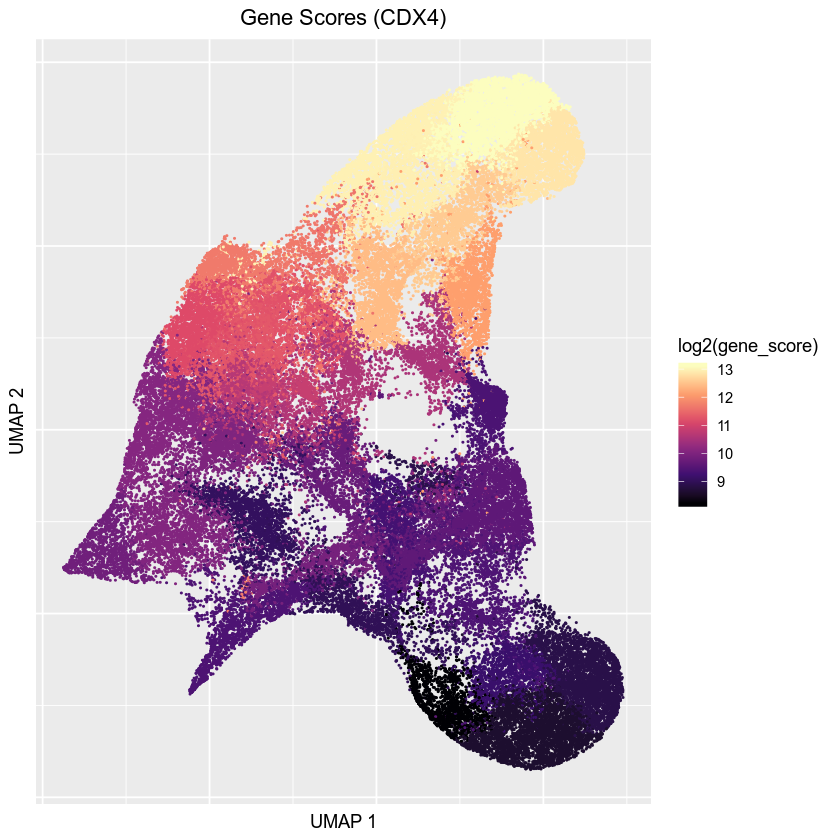

In [280]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, gene_score=as.numeric(distal_summed_gene[GENE, ])[clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=log2(gene_score))) +
ggtitle(sprintf("Gene Scores (%s)", GENE)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

In [ ]:
# cts_to_cluster = log_norm_cts 
cts_to_cluster = t(scale(t(distal_summed_gene)))

In [ ]:
# ADD RAND SEED - not required

km_mb = MiniBatchKmeans(cts_to_cluster, 
                        batch_size = 1000,
                        clusters=10,
                        num_init = 10, 
                        verbose = FALSE)

In [ ]:
# reorder based on hierarchical clustering
# pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

# distance    = dist(t(scale(t(km_mb$centroids))))
# cluster     = hclust(distance, method="ward")
# dendrogram  = as.dendrogram(cluster)
# rowInd = rev(order.dendrogram(dendrogram))
# pr_mb = order(rowInd)[pr_mb]

In [ ]:
# no hierarchical clustering, follow order of km_mb$centroids
pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

In [ ]:
table(pr_mb)

In [ ]:
order(rowVars(km_mb$centroids))

In [ ]:
cts_clustered = cts_to_cluster[order(pr_mb),]
head(cts_clustered, 2)

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5)
hist(as.vector(cts_clustered))

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

idxs = seq(1, nrow(cts_clustered), 10) # if subsample
ggplot(data = melt(cts_clustered[idxs, ]), 
       mapping = aes(x = Var2,
                     y = Var1,
                     fill = value)) +
geom_tile()  + ylab(NULL) + xlab("Condition") +  
geom_raster(aes(fill=value)) +
scale_fill_viridis(limits=c(-2.5, 2.5), oob=squish, option = "A") +
# scale_fill_viridis(option="A") + 
# scale_fill_gradient2(low="red", mid="black", high="blue") +
facet_grid(sort(pr_mb)[idxs] ~ ., switch = "y", scales = "free_y", space = "free_y")+
# theme_classic() +
theme(axis.text.x=element_text(angle=90,hjust=1),
      axis.text.y=element_blank(),
      axis.ticks.y=element_blank())
#       panel.spacing.y = unit(0.03, "cm"),
#       strip.text.y = element_text(size = 3))  
#       strip.background = element_rect(size = 0.1))

# ggsave(sprintf("figs/%s_heatmap_idr_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        dpi=1000)

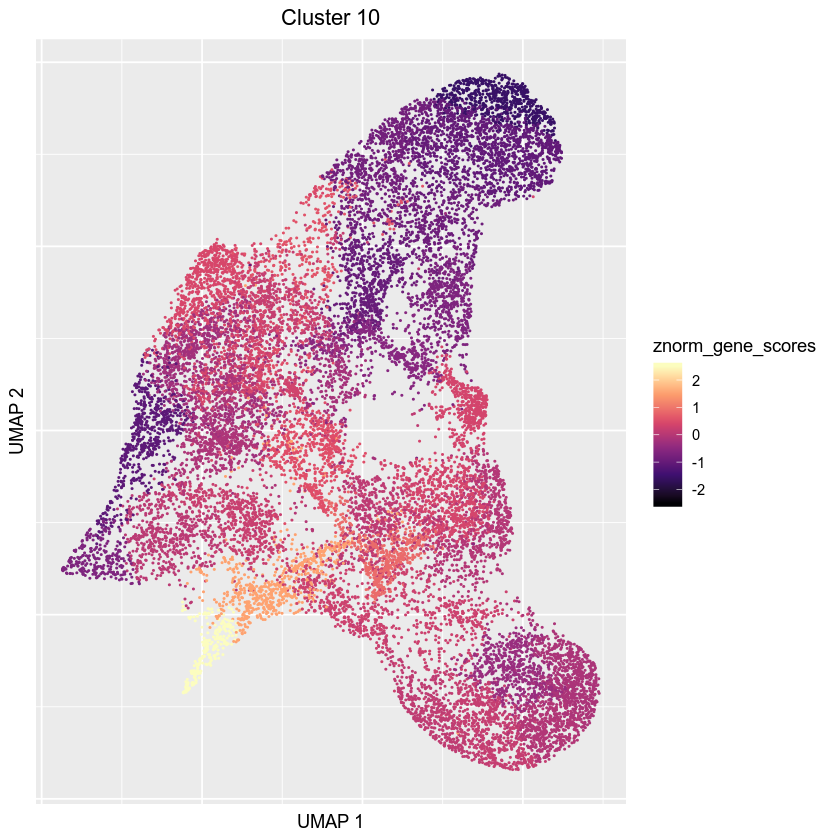

In [68]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(x.sp@umap, znorm_gene_scores=cts_clustered["KRT32",][clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1], 20000), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=znorm_gene_scores)) +
ggtitle(sprintf("Cluster %d", i)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(-2.5, 2.5), oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
      axis.ticks = element_blank(),
     axis.text =element_blank())

In [58]:
plots = list()
for (i in seq(1,10)) {
    df = data.frame(x.sp@umap, znorm_gene_scores=km_mb$centroids[i, ][clusters])
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 20000), ]
    
    plots[[i]] <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=znorm_gene_scores)) +
    ggtitle(sprintf("Cluster %d", i)) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(-2.5, 2.5), oob=squish, option = "A") +
    theme(plot.title = element_text(hjust = 0.5),
         legend.position = "none",
         axis.ticks = element_blank(),
         axis.text =element_blank())
}

In [60]:
df = data.frame(x.sp@umap, znorm_gene_scores=km_mb$centroids[1, ][clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1], 20000), ]

cur_plot <- ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap.1 , y=umap.2, col=znorm_gene_scores)) +
ggtitle(sprintf("Cluster %d", i)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(-2.5, 2.5), oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank())

legend_only = cowplot::get_legend(cur_plot)

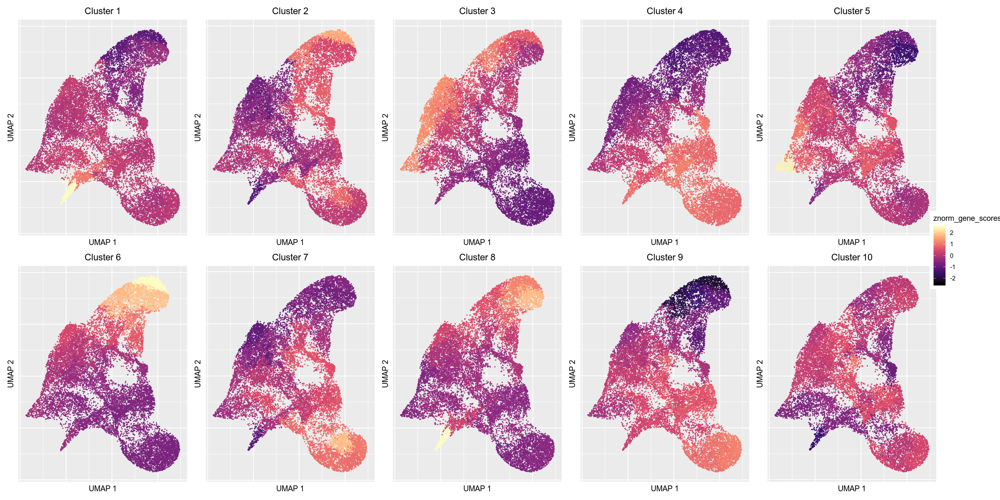

In [59]:
options(repr.plot.width = 20, repr.plot.height = 10)
wrap_plots(wrap_plots(plots, ncol = 5), legend_only, widths=c(0.95,0.05)) 
# ggsave(sprintf("figs/%s_gridmap_gene_score_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        dpi=300, width = 20, height = 10)

## Write Gene Lists for Clusters

In [62]:
CLUSTER_IDX = 1
NORM = 'znorm_gene_scores'
LIST_PATH = sprintf("gene_lists/%s_%s_n%d/idx%d.txt", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), CLUSTER_IDX)
# rownames(vsd_assay_to_cluster_normalized)[(which(pr_mb==CLUSTER_IDX))]
LIST_PATH

[1] "gene_lists/20200309_znorm_gene_scores_n10/idx1.txt"

In [64]:
for (i in seq(1,length(table(pr_mb)))){
LIST_PATH = sprintf("gene_lists/%s_%s_n%d/idx%d.txt", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), i)
fileConn = file(LIST_PATH)
writeLines(rownames(cts_to_cluster)[(which(pr_mb==i))], fileConn)
close(fileConn)}

In [65]:
ALL_PEAKS_BED_PATH = sprintf("gene_lists/%s_%s_n%d/all_genes.txt", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)))
print(ALL_PEAKS_BED_PATH)
fileConn = file(ALL_PEAKS_BED_PATH)
writeLines(rownames(cts_to_cluster), fileConn)
close(fileConn)

[1] "gene_lists/20200309_znorm_gene_scores_n10/all_genes.txt"


In [79]:
idx2 = read.table("./idx2.gc.txt")$V2
idx5 = read.table("./idx5.gc.txt")$V2
idx11 = read.table("./idx11.gc.txt")$V2
idx18 = read.table("./idx18.gc.txt")$V2
idx19 = read.table("./idx19.gc.txt")$V2

In [80]:
median(idx2)
median(idx5)
median(idx11)
median(idx18)
median(idx19)

[1] 0.475

[1] 0.36

[1] 0.46

[1] 0.37

[1] 0.415

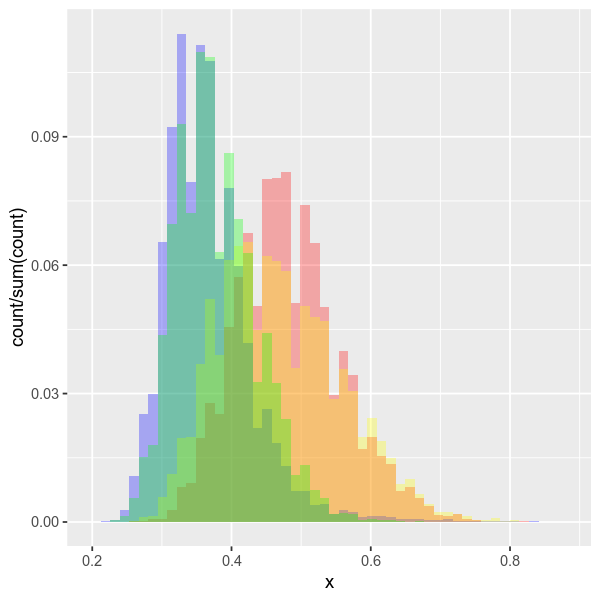

In [97]:
options(repr.plot.width = 5, repr.plot.height = 5)
ggplot(data.frame(x=idx2), aes(x=x)) +
geom_histogram(aes(y=..count../sum(..count..)), alpha=0.3, bins=50, fill='red') + 
geom_histogram(data=data.frame(x=idx5), aes(x=x, y=..count../sum(..count..)), alpha=0.3, bins=50, 
               fill='blue') +
geom_histogram(data=data.frame(x=idx11), aes(x=x, y=..count../sum(..count..)), alpha=0.3, bins=50, 
               fill='yellow') +
geom_histogram(data=data.frame(x=idx18), aes(x=x, y=..count../sum(..count..)), alpha=0.3, bins=50, 
               fill='green')